<a href="https://www.kaggle.com/code/newarifooddetection/trainwithchangeinaugparam?scriptVersionId=165485513" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/coco2017/"
x = load('/kaggle/input/monumentimagenotaugmented/train/monumentimage_10006.jpg')
print(x.shape)

(683, 1024, 3)


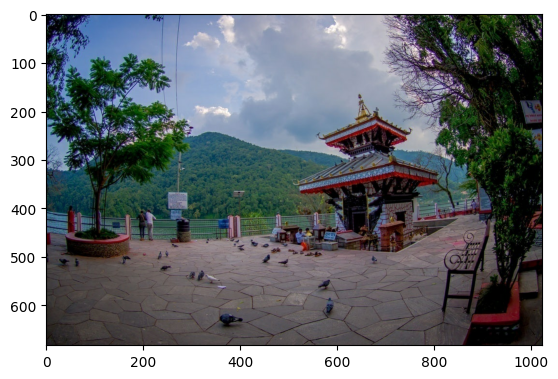

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

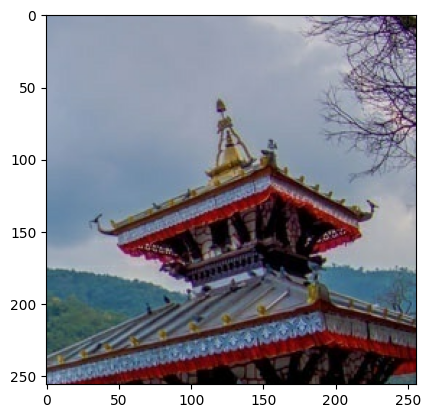

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

In [14]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

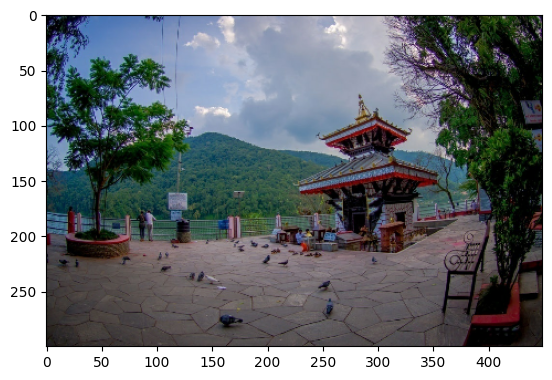

In [15]:
x = resize_with_aspect_ratio(x,300)
plt.imshow(x/255)

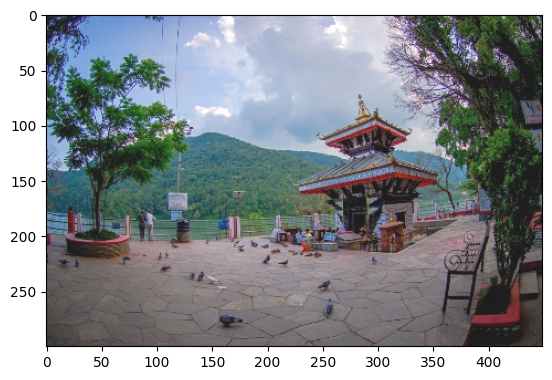

In [16]:
x_brightness = tf.image.random_brightness(x, 75)
plt.imshow(x_brightness/255)

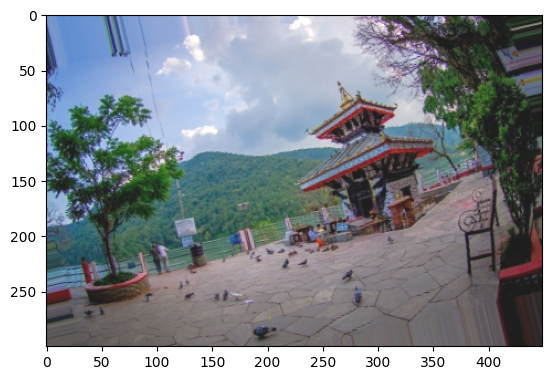

In [17]:
# Define the rotation angle in radians
rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

# Apply the rotation using tfa.image.rotate
x_rotated = tfa.image.rotate(x_brightness, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
plt.imshow(x_rotated/255)

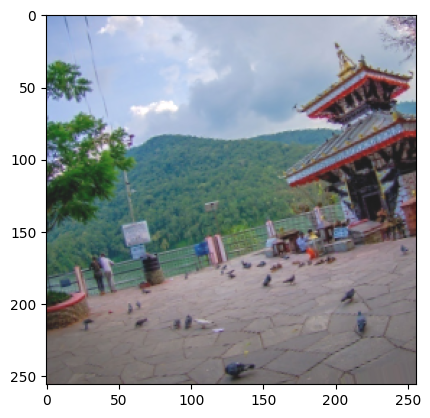

In [18]:
x_aug = random_crop(x_rotated)
plt.imshow(x_aug/255.0)

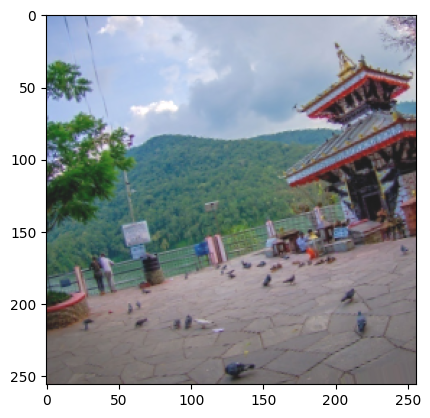

In [19]:
x_jitter = random_jitter(x_aug)
plt.imshow(x_jitter/255.0)

In [20]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 75)
    # Define the rotation angle in radians
    rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
    real_image = random_crop(real_image)
    

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [21]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [22]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [23]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files('/kaggle/input/monumentimagenotaugmented/train/*')
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

525

In [24]:
# create input pipeline
val = tf.data.Dataset.list_files('/kaggle/input/monumentimagenotaugmented/val/*')
val = val.map(load_test_image)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

70

In [25]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [26]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 225, 3)


In [27]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 450, 3)


In [28]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

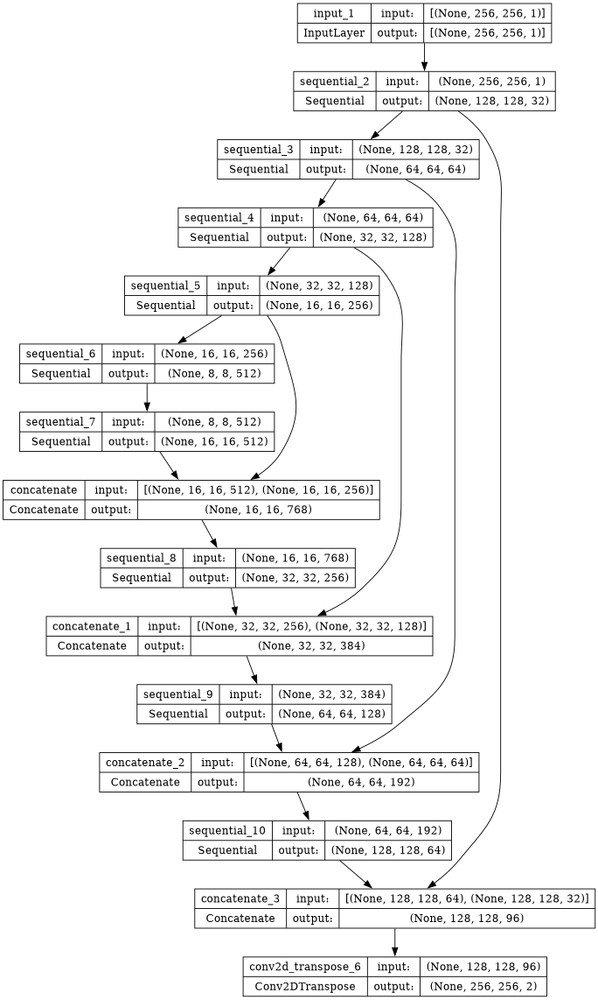

In [29]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [30]:
# gen.load_weights('/kaggle/input/feb28-coco/modelsFeb7/gen_weight.keras')

In [31]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

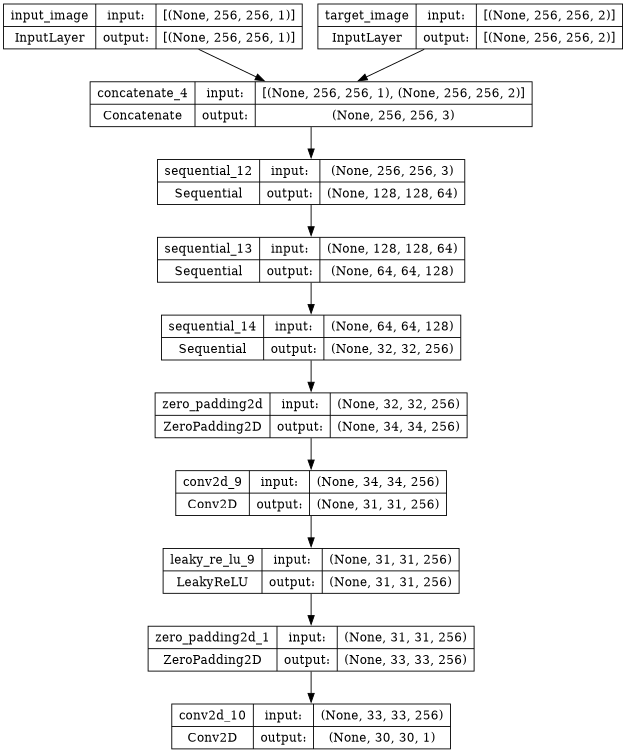

In [32]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [33]:
# disc.load_weights('/kaggle/input/feb28-coco/modelsFeb7/disc_wweight.keras')

In [34]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [35]:
LAMBDA = 150

In [36]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [37]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [38]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [39]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [40]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [41]:
epochs = 250

In [42]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [43]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [44]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [45]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [46]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [47]:
os.mkdir('/kaggle/working/gen_output/')

In [48]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [49]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image,256)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


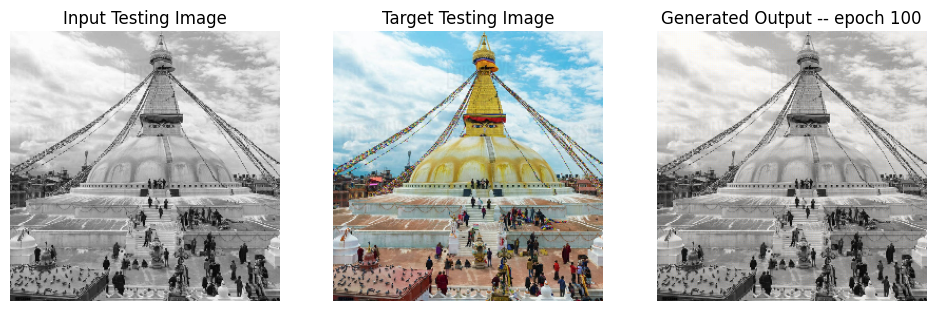

SSIM Score: 0.8757438659667969
PSNR Score: 20.535282135009766


In [50]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/monumentimage_10345.jpg',100)

In [51]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/monumentimage_10345.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [52]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 2s 0us/step
Training Details
Generator-- total_loss:10.38068 gan_loss:1.22612 l1_loss:0.05066 perceptual_loss:0.01037 Discriminator-- total_loss:1.26063 real_loss:0.62409 generated_loss:0.63654 --- SSIM 0.85070 PSNR 22.19709 LPIPS 0.00000
Time taken for epoch 1 is 657.4103918075562 sec
Number of iteration 525
Validation Details
Generator-- total_loss:13.10352 gan_loss:1.07954 l1_loss:0.06697  perceptual_loss:0.01319 Discriminator-- total_loss:1.91851 real_loss:0.53565 generated_loss:1.38287 --- SSIM 0.84898 PSNR 19.63305 LPIPS 0.00000
Time taken for epoch 1 is 707.817067861557 sec
Number of iteration 70
Displaying one random test image...


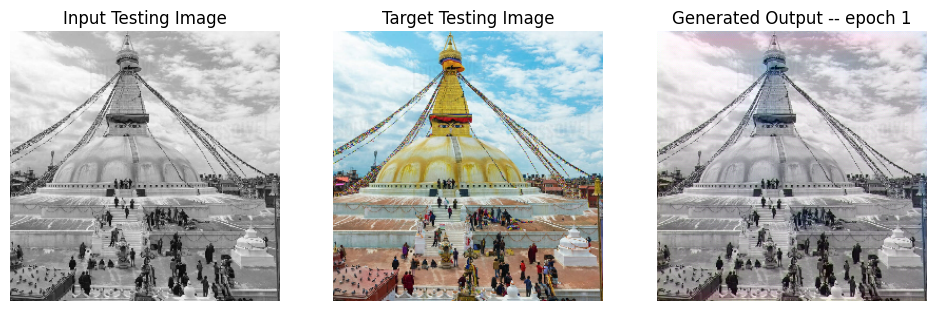

SSIM Score: 0.8842774033546448
PSNR Score: 20.177867889404297
Epoch 1
Training Details
Generator-- total_loss:9.54381 gan_loss:1.12384 l1_loss:0.04695 perceptual_loss:0.00918 Discriminator-- total_loss:1.22763 real_loss:0.60920 generated_loss:0.61843 --- SSIM 0.88471 PSNR 22.69258 LPIPS 0.00000
Time taken for epoch 2 is 640.4392578601837 sec
Number of iteration 525
Validation Details
Generator-- total_loss:10.66042 gan_loss:0.78376 l1_loss:0.05632  perceptual_loss:0.00953 Discriminator-- total_loss:1.48199 real_loss:0.84090 generated_loss:0.64109 --- SSIM 0.92232 PSNR 21.22276 LPIPS 0.00000
Time taken for epoch 2 is 688.4274854660034 sec
Number of iteration 70
Epoch 2
Training Details
Generator-- total_loss:9.44570 gan_loss:1.28823 l1_loss:0.04545 perceptual_loss:0.00893 Discriminator-- total_loss:1.64303 real_loss:0.82255 generated_loss:0.82048 --- SSIM 0.89174 PSNR 22.98847 LPIPS 0.00000
Time taken for epoch 3 is 655.2906920909882 sec
Number of iteration 525
Validation Details
Genera

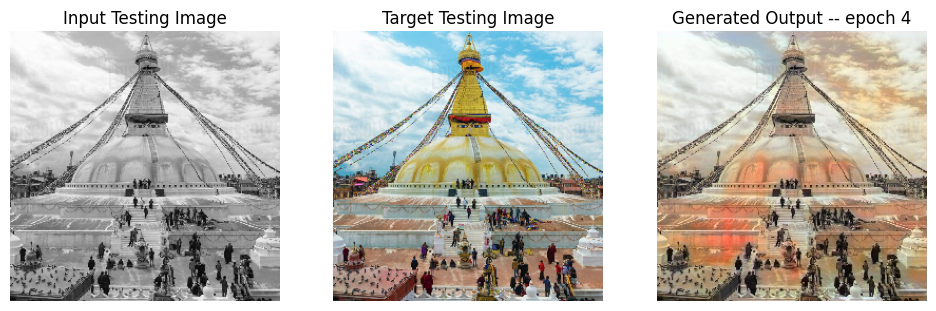

SSIM Score: 0.8853740096092224
PSNR Score: 18.669435501098633
Epoch 4
Training Details
Generator-- total_loss:9.20540 gan_loss:1.07094 l1_loss:0.04550 perceptual_loss:0.00873 Discriminator-- total_loss:1.20514 real_loss:0.58406 generated_loss:0.62108 --- SSIM 0.88696 PSNR 22.88421 LPIPS 0.00000
Time taken for epoch 5 is 647.848224401474 sec
Number of iteration 525
Validation Details
Generator-- total_loss:10.75786 gan_loss:0.77781 l1_loss:0.05525  perceptual_loss:0.01129 Discriminator-- total_loss:1.39583 real_loss:0.70336 generated_loss:0.69247 --- SSIM 0.89399 PSNR 21.24941 LPIPS 0.00000
Time taken for epoch 5 is 695.6258800029755 sec
Number of iteration 70
Epoch 5
Training Details
Generator-- total_loss:9.14189 gan_loss:1.06753 l1_loss:0.04521 perceptual_loss:0.00862 Discriminator-- total_loss:1.21790 real_loss:0.58741 generated_loss:0.63049 --- SSIM 0.88855 PSNR 22.91678 LPIPS 0.00000
Time taken for epoch 6 is 640.0242040157318 sec
Number of iteration 525
Validation Details
Generat

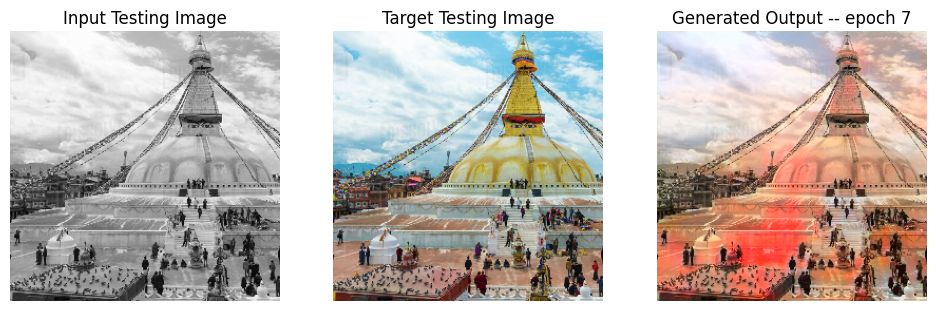

SSIM Score: 0.874195396900177
PSNR Score: 16.59516143798828
Epoch 7
Training Details
Generator-- total_loss:9.03740 gan_loss:1.05677 l1_loss:0.04468 perceptual_loss:0.00852 Discriminator-- total_loss:1.20959 real_loss:0.58663 generated_loss:0.62296 --- SSIM 0.88911 PSNR 22.97302 LPIPS 0.00000
Time taken for epoch 8 is 640.7552742958069 sec
Number of iteration 525
Validation Details
Generator-- total_loss:9.98749 gan_loss:0.77203 l1_loss:0.05120  perceptual_loss:0.01024 Discriminator-- total_loss:1.50732 real_loss:0.71261 generated_loss:0.79471 --- SSIM 0.91822 PSNR 22.02065 LPIPS 0.00000
Time taken for epoch 8 is 688.4877240657806 sec
Number of iteration 70
Epoch 8
Training Details
Generator-- total_loss:9.01753 gan_loss:1.28868 l1_loss:0.04332 perceptual_loss:0.00820 Discriminator-- total_loss:1.85576 real_loss:0.92947 generated_loss:0.92629 --- SSIM 0.89584 PSNR 23.37363 LPIPS 0.00000
Time taken for epoch 9 is 643.7306892871857 sec
Number of iteration 525
Validation Details
Generator

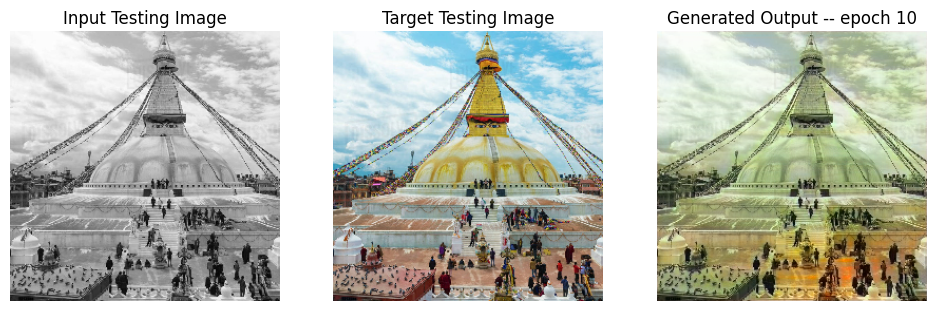

SSIM Score: 0.8901024460792542
PSNR Score: 19.202770233154297
Epoch 10
Training Details
Generator-- total_loss:8.30660 gan_loss:0.63414 l1_loss:0.04327 perceptual_loss:0.00788 Discriminator-- total_loss:1.40183 real_loss:0.87849 generated_loss:0.52335 --- SSIM 0.89852 PSNR 23.25948 LPIPS 0.00000
Time taken for epoch 11 is 581.2369120121002 sec
Number of iteration 525
Validation Details
Generator-- total_loss:10.57618 gan_loss:0.43625 l1_loss:0.05817  perceptual_loss:0.00943 Discriminator-- total_loss:1.66205 real_loss:1.15831 generated_loss:0.50374 --- SSIM 0.92188 PSNR 20.54849 LPIPS 0.00000
Time taken for epoch 11 is 628.7845590114594 sec
Number of iteration 70
Epoch 11
Training Details
Generator-- total_loss:13.89094 gan_loss:6.16934 l1_loss:0.04358 perceptual_loss:0.00790 Discriminator-- total_loss:0.21737 real_loss:0.11017 generated_loss:0.10720 --- SSIM 0.89916 PSNR 23.18988 LPIPS 0.00000
Time taken for epoch 12 is 440.906281709671 sec
Number of iteration 525
Validation Details
G

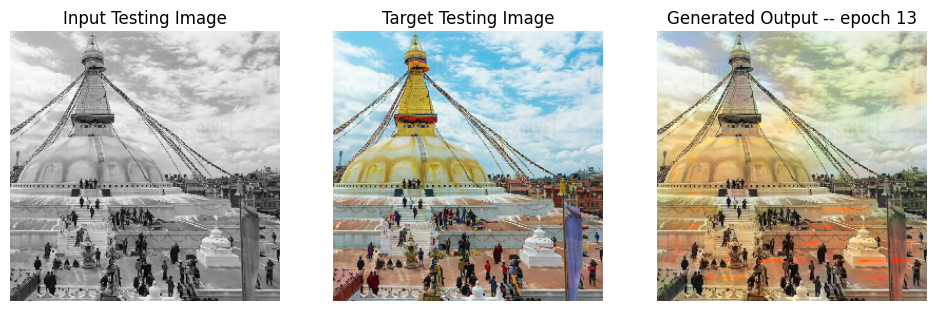

SSIM Score: 0.8663424849510193
PSNR Score: 18.214229583740234
Epoch 13
Training Details
Generator-- total_loss:17.17130 gan_loss:9.45772 l1_loss:0.04353 perceptual_loss:0.00790 Discriminator-- total_loss:0.00232 real_loss:0.00117 generated_loss:0.00115 --- SSIM 0.89924 PSNR 23.18135 LPIPS 0.00000
Time taken for epoch 14 is 441.1122965812683 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.79526 gan_loss:0.02431 l1_loss:0.04366  perceptual_loss:0.00815 Discriminator-- total_loss:4.77927 real_loss:4.74516 generated_loss:0.03411 --- SSIM 0.93240 PSNR 23.05982 LPIPS 0.00000
Time taken for epoch 14 is 488.46830439567566 sec
Number of iteration 70
Epoch 14
Training Details
Generator-- total_loss:18.66487 gan_loss:10.93553 l1_loss:0.04361 perceptual_loss:0.00792 Discriminator-- total_loss:0.00057 real_loss:0.00029 generated_loss:0.00028 --- SSIM 0.89806 PSNR 23.17398 LPIPS 0.00000
Time taken for epoch 15 is 438.5572326183319 sec
Number of iteration 525
Validation Detail

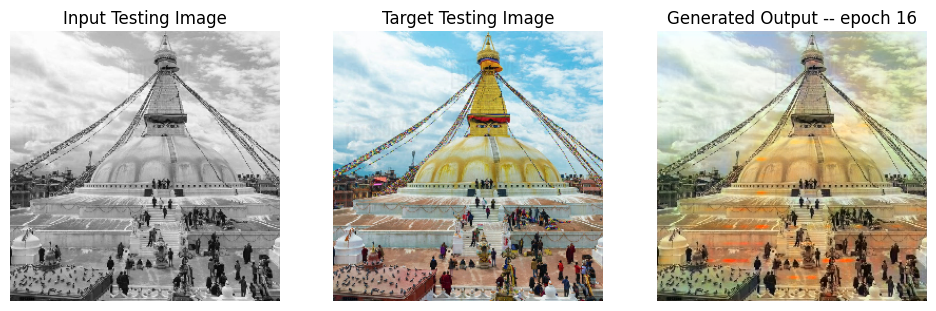

SSIM Score: 0.8836760520935059
PSNR Score: 18.827367782592773
Epoch 16
Training Details
Generator-- total_loss:20.21718 gan_loss:12.48359 l1_loss:0.04363 perceptual_loss:0.00793 Discriminator-- total_loss:0.00023 real_loss:0.00011 generated_loss:0.00012 --- SSIM 0.89925 PSNR 23.16848 LPIPS 0.00000
Time taken for epoch 17 is 439.7640800476074 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.80121 gan_loss:0.00560 l1_loss:0.04381  perceptual_loss:0.00816 Discriminator-- total_loss:6.55364 real_loss:6.54438 generated_loss:0.00926 --- SSIM 0.93189 PSNR 23.04340 LPIPS 0.00000
Time taken for epoch 17 is 487.798513174057 sec
Number of iteration 70
Epoch 17
Training Details
Generator-- total_loss:19.50164 gan_loss:11.79395 l1_loss:0.04349 perceptual_loss:0.00789 Discriminator-- total_loss:1.22337 real_loss:0.63916 generated_loss:0.58421 --- SSIM 0.89810 PSNR 23.18340 LPIPS 0.00000
Time taken for epoch 18 is 438.5032799243927 sec
Number of iteration 525
Validation Details

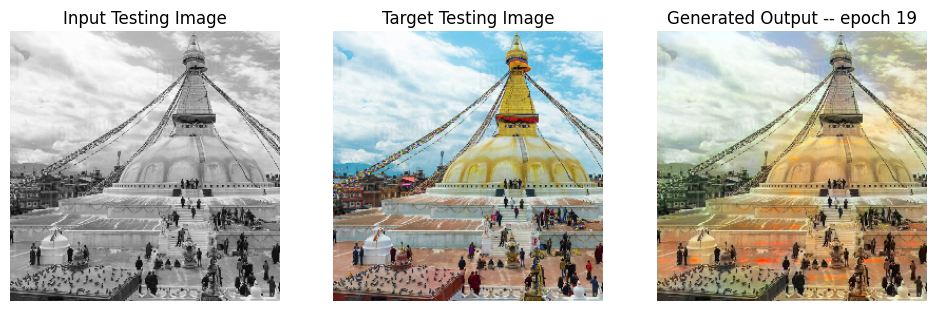

SSIM Score: 0.884157657623291
PSNR Score: 19.033475875854492
Epoch 19
Training Details
Generator-- total_loss:16.13494 gan_loss:8.43629 l1_loss:0.04343 perceptual_loss:0.00790 Discriminator-- total_loss:0.00567 real_loss:0.00248 generated_loss:0.00319 --- SSIM 0.89776 PSNR 23.20540 LPIPS 0.00000
Time taken for epoch 20 is 440.6837887763977 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.81057 gan_loss:0.02138 l1_loss:0.04379  perceptual_loss:0.00814 Discriminator-- total_loss:9.63433 real_loss:9.63084 generated_loss:0.00349 --- SSIM 0.93183 PSNR 23.03354 LPIPS 0.00000
Time taken for epoch 20 is 488.5202386379242 sec
Number of iteration 70
Epoch 20
Training Details
Generator-- total_loss:17.29163 gan_loss:9.55510 l1_loss:0.04369 perceptual_loss:0.00789 Discriminator-- total_loss:0.08762 real_loss:0.04687 generated_loss:0.04075 --- SSIM 0.89721 PSNR 23.16602 LPIPS 0.00000
Time taken for epoch 21 is 438.10883116722107 sec
Number of iteration 525
Validation Details


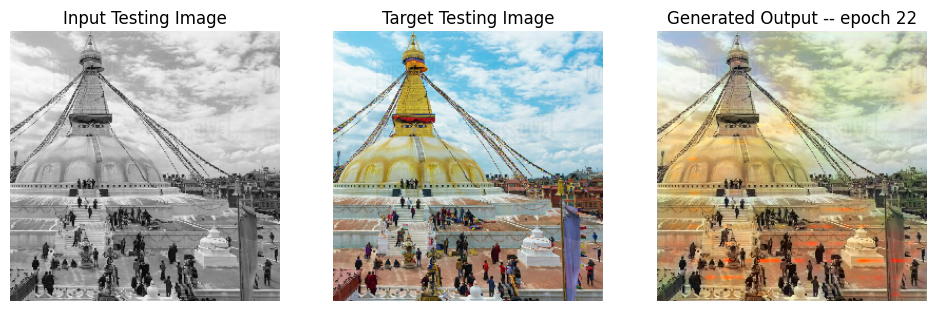

SSIM Score: 0.8671431541442871
PSNR Score: 18.19951057434082
Epoch 22
Training Details
Generator-- total_loss:17.61930 gan_loss:9.87234 l1_loss:0.04371 perceptual_loss:0.00794 Discriminator-- total_loss:0.03412 real_loss:0.02248 generated_loss:0.01163 --- SSIM 0.89650 PSNR 23.14872 LPIPS 0.00000
Time taken for epoch 23 is 433.9975616931915 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.76472 gan_loss:0.01081 l1_loss:0.04353  perceptual_loss:0.00817 Discriminator-- total_loss:7.48178 real_loss:7.47721 generated_loss:0.00457 --- SSIM 0.93301 PSNR 23.08307 LPIPS 0.00000
Time taken for epoch 23 is 481.90415954589844 sec
Number of iteration 70
Epoch 23
Training Details
Generator-- total_loss:19.26038 gan_loss:11.55610 l1_loss:0.04347 perceptual_loss:0.00790 Discriminator-- total_loss:0.00253 real_loss:0.00035 generated_loss:0.00217 --- SSIM 0.89951 PSNR 23.19554 LPIPS 0.00000
Time taken for epoch 24 is 436.1430113315582 sec
Number of iteration 525
Validation Details

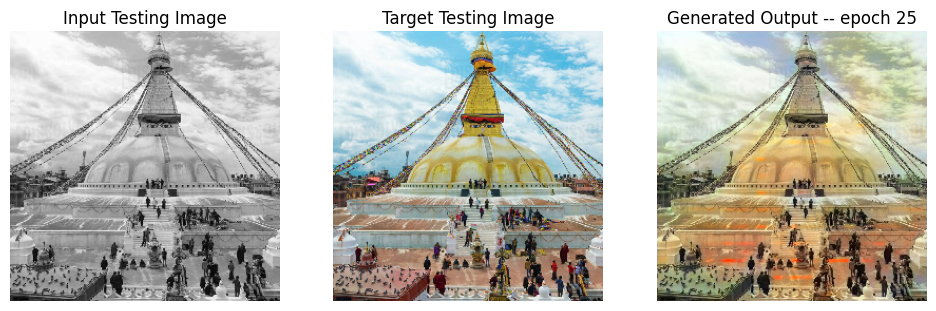

SSIM Score: 0.8835463523864746
PSNR Score: 18.966014862060547
Epoch 25
Training Details
Generator-- total_loss:19.36754 gan_loss:11.64267 l1_loss:0.04361 perceptual_loss:0.00789 Discriminator-- total_loss:0.00139 real_loss:0.00065 generated_loss:0.00074 --- SSIM 0.90005 PSNR 23.16760 LPIPS 0.00000
Time taken for epoch 26 is 436.21478033065796 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.78007 gan_loss:0.00347 l1_loss:0.04369  perceptual_loss:0.00816 Discriminator-- total_loss:9.01219 real_loss:9.00747 generated_loss:0.00472 --- SSIM 0.93227 PSNR 23.05716 LPIPS 0.00000
Time taken for epoch 26 is 483.2094256877899 sec
Number of iteration 70
Epoch 26
Training Details
Generator-- total_loss:20.50600 gan_loss:12.80011 l1_loss:0.04351 perceptual_loss:0.00787 Discriminator-- total_loss:0.00040 real_loss:0.00020 generated_loss:0.00020 --- SSIM 0.89882 PSNR 23.19421 LPIPS 0.00000
Time taken for epoch 27 is 434.3082113265991 sec
Number of iteration 525
Validation Detai

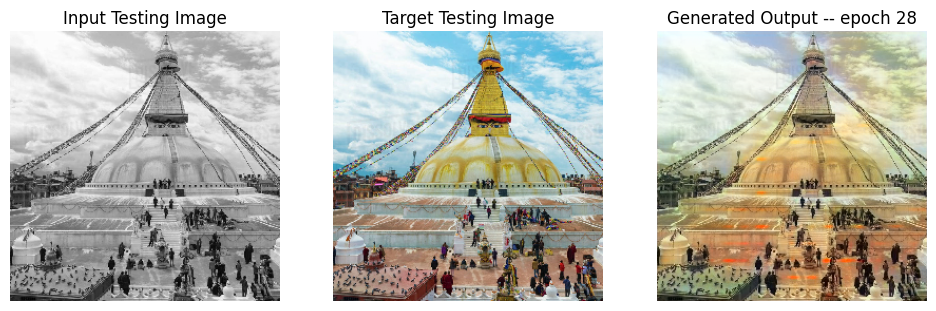

SSIM Score: 0.8845207691192627
PSNR Score: 18.856245040893555
Epoch 28
Training Details
Generator-- total_loss:21.10637 gan_loss:13.38418 l1_loss:0.04356 perceptual_loss:0.00792 Discriminator-- total_loss:0.42135 real_loss:0.23947 generated_loss:0.18188 --- SSIM 0.89910 PSNR 23.17777 LPIPS 0.00000
Time taken for epoch 29 is 435.5997054576874 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.82005 gan_loss:0.06586 l1_loss:0.04359  perceptual_loss:0.00811 Discriminator-- total_loss:6.89942 real_loss:6.81138 generated_loss:0.08804 --- SSIM 0.93278 PSNR 23.05815 LPIPS 0.00000
Time taken for epoch 29 is 483.17181181907654 sec
Number of iteration 70
Epoch 29
Training Details
Generator-- total_loss:19.73287 gan_loss:12.01824 l1_loss:0.04353 perceptual_loss:0.00790 Discriminator-- total_loss:0.00260 real_loss:0.00148 generated_loss:0.00112 --- SSIM 0.89770 PSNR 23.19054 LPIPS 0.00000
Time taken for epoch 30 is 436.3717451095581 sec
Number of iteration 525
Validation Detai

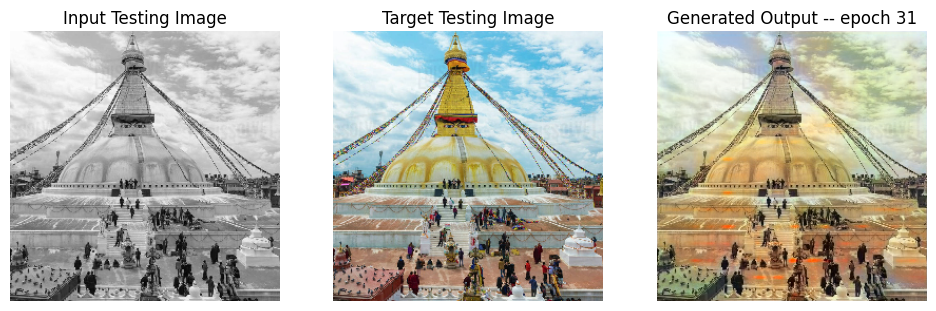

SSIM Score: 0.8798133730888367
PSNR Score: 18.655105590820312
Epoch 31
Training Details
Generator-- total_loss:21.63430 gan_loss:13.94005 l1_loss:0.04343 perceptual_loss:0.00787 Discriminator-- total_loss:0.00050 real_loss:0.00025 generated_loss:0.00024 --- SSIM 0.89896 PSNR 23.21868 LPIPS 0.00000
Time taken for epoch 32 is 437.1360640525818 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.80311 gan_loss:0.00841 l1_loss:0.04377  perceptual_loss:0.00820 Discriminator-- total_loss:11.27861 real_loss:11.27465 generated_loss:0.00396 --- SSIM 0.93230 PSNR 23.03331 LPIPS 0.00000
Time taken for epoch 32 is 484.1141517162323 sec
Number of iteration 70
Epoch 32
Training Details
Generator-- total_loss:22.30391 gan_loss:14.56948 l1_loss:0.04364 perceptual_loss:0.00792 Discriminator-- total_loss:0.00022 real_loss:0.00012 generated_loss:0.00009 --- SSIM 0.89867 PSNR 23.16740 LPIPS 0.00000
Time taken for epoch 33 is 436.7822585105896 sec
Number of iteration 525
Validation Deta

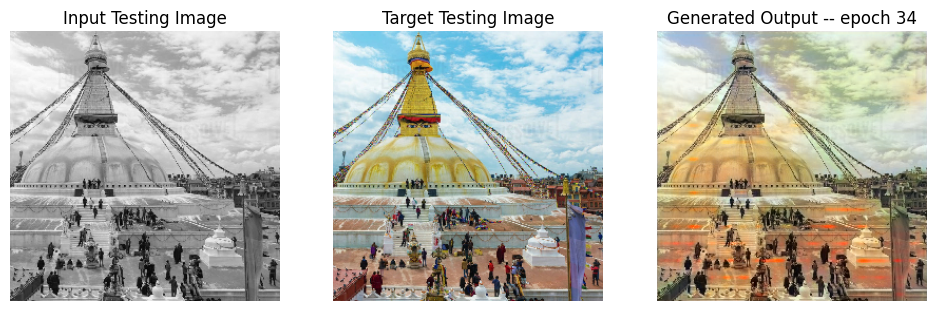

SSIM Score: 0.8658607602119446
PSNR Score: 18.24709701538086
Epoch 34
Training Details
Generator-- total_loss:23.78304 gan_loss:16.06817 l1_loss:0.04352 perceptual_loss:0.00791 Discriminator-- total_loss:0.00015 real_loss:0.00006 generated_loss:0.00008 --- SSIM 0.89718 PSNR 23.18453 LPIPS 0.00000
Time taken for epoch 35 is 441.8119750022888 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.72914 gan_loss:0.00041 l1_loss:0.04343  perceptual_loss:0.00810 Discriminator-- total_loss:12.16945 real_loss:12.16901 generated_loss:0.00044 --- SSIM 0.93318 PSNR 23.11158 LPIPS 0.00000
Time taken for epoch 35 is 489.3751926422119 sec
Number of iteration 70
Epoch 35
Training Details
Generator-- total_loss:23.95211 gan_loss:16.21093 l1_loss:0.04371 perceptual_loss:0.00790 Discriminator-- total_loss:0.36771 real_loss:0.20677 generated_loss:0.16094 --- SSIM 0.89781 PSNR 23.16257 LPIPS 0.00000
Time taken for epoch 36 is 439.8701739311218 sec
Number of iteration 525
Validation Detai

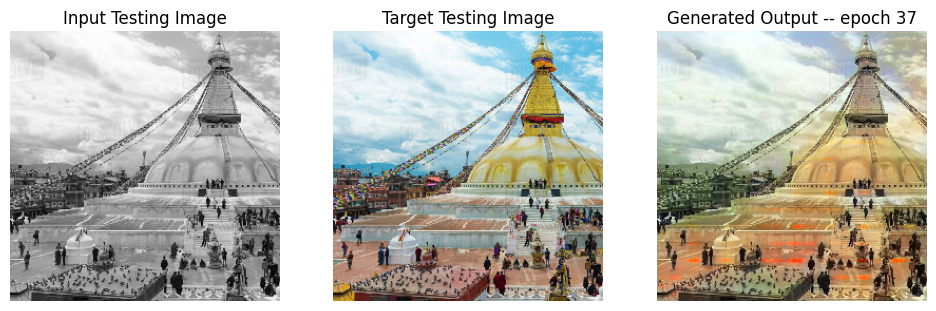

SSIM Score: 0.887841522693634
PSNR Score: 19.480926513671875
Epoch 37
Training Details
Generator-- total_loss:25.05433 gan_loss:17.32383 l1_loss:0.04365 perceptual_loss:0.00789 Discriminator-- total_loss:0.01066 real_loss:0.00840 generated_loss:0.00226 --- SSIM 0.89783 PSNR 23.16364 LPIPS 0.00000
Time taken for epoch 38 is 441.9830152988434 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.77030 gan_loss:0.01017 l1_loss:0.04359  perceptual_loss:0.00815 Discriminator-- total_loss:9.11580 real_loss:9.11200 generated_loss:0.00380 --- SSIM 0.93213 PSNR 23.07221 LPIPS 0.00000
Time taken for epoch 38 is 489.9341821670532 sec
Number of iteration 70
Epoch 38
Training Details
Generator-- total_loss:24.91581 gan_loss:17.18307 l1_loss:0.04366 perceptual_loss:0.00789 Discriminator-- total_loss:0.00085 real_loss:0.00032 generated_loss:0.00052 --- SSIM 0.89976 PSNR 23.16575 LPIPS 0.00000
Time taken for epoch 39 is 438.47746324539185 sec
Number of iteration 525
Validation Detail

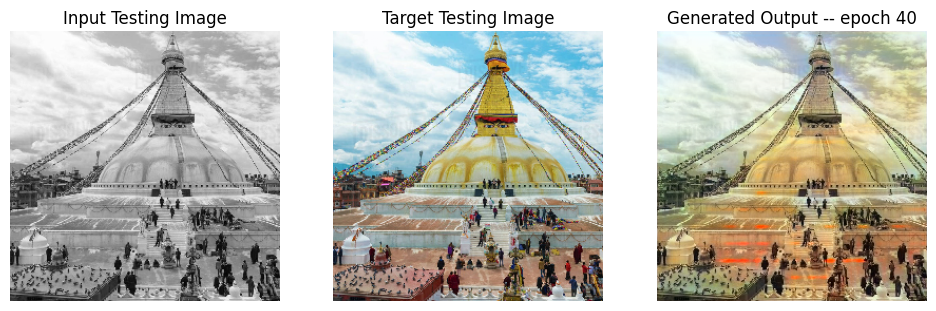

SSIM Score: 0.8816225528717041
PSNR Score: 18.87449073791504
Epoch 40
Training Details
Generator-- total_loss:26.01967 gan_loss:18.31371 l1_loss:0.04349 perceptual_loss:0.00788 Discriminator-- total_loss:0.00012 real_loss:0.00006 generated_loss:0.00005 --- SSIM 0.89841 PSNR 23.19166 LPIPS 0.00000
Time taken for epoch 41 is 437.9155616760254 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.73800 gan_loss:0.00153 l1_loss:0.04343  perceptual_loss:0.00815 Discriminator-- total_loss:12.04912 real_loss:12.04667 generated_loss:0.00246 --- SSIM 0.93235 PSNR 23.11070 LPIPS 0.00000
Time taken for epoch 41 is 485.17411613464355 sec
Number of iteration 70
Epoch 41
Training Details
Generator-- total_loss:26.39494 gan_loss:18.66600 l1_loss:0.04360 perceptual_loss:0.00792 Discriminator-- total_loss:0.00012 real_loss:0.00005 generated_loss:0.00007 --- SSIM 0.89920 PSNR 23.16298 LPIPS 0.00000
Time taken for epoch 42 is 434.0295670032501 sec
Number of iteration 525
Validation Deta

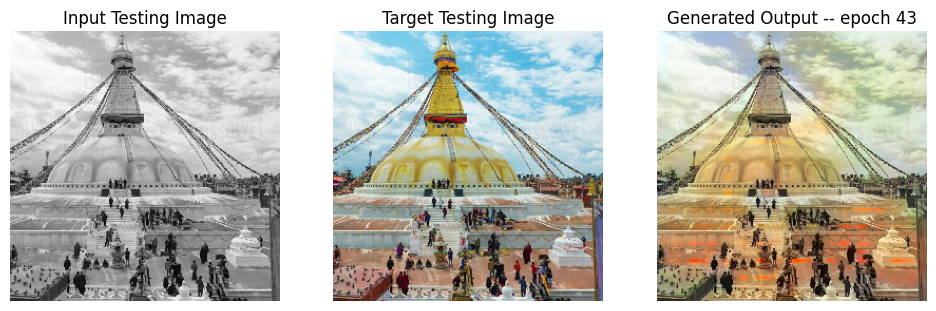

SSIM Score: 0.8720141053199768
PSNR Score: 18.446842193603516
Reduced generator learning rate to 0.0004500000213738531 at epoch 43
Epoch 43
Training Details
Generator-- total_loss:6.82039 gan_loss:0.03800 l1_loss:0.03778 perceptual_loss:0.00743 Discriminator-- total_loss:34.81200 real_loss:34.81197 generated_loss:0.00002 --- SSIM 0.91516 PSNR 24.67346 LPIPS 0.00000
Time taken for epoch 44 is 574.8439784049988 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.90693 gan_loss:0.00000 l1_loss:0.03833  perceptual_loss:0.00772 Discriminator-- total_loss:29.15516 real_loss:29.15515 generated_loss:0.00001 --- SSIM 0.94716 PSNR 24.40990 LPIPS 0.00000
Time taken for epoch 44 is 621.6059138774872 sec
Number of iteration 70
Epoch 44
Training Details
Generator-- total_loss:6.73589 gan_loss:0.00000 l1_loss:0.03762 perceptual_loss:0.00729 Discriminator-- total_loss:35.93403 real_loss:35.93399 generated_loss:0.00004 --- SSIM 0.91694 PSNR 24.73000 LPIPS 0.00000
Time taken for epoc

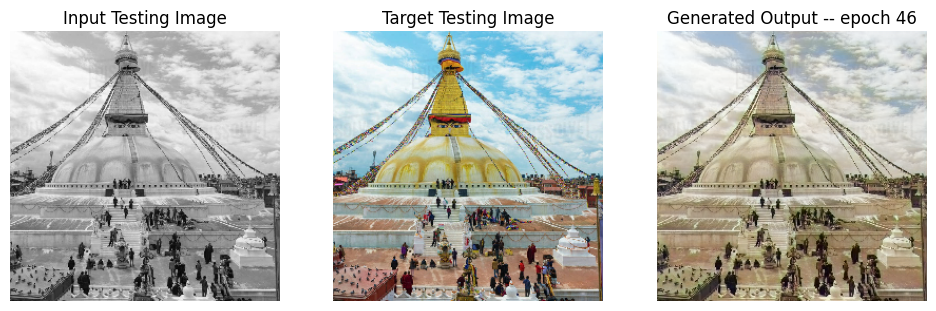

SSIM Score: 0.9085531234741211
PSNR Score: 21.291879653930664
Epoch 46
Training Details
Generator-- total_loss:6.66512 gan_loss:0.00001 l1_loss:0.03725 perceptual_loss:0.00718 Discriminator-- total_loss:36.12020 real_loss:36.12017 generated_loss:0.00002 --- SSIM 0.91794 PSNR 24.80588 LPIPS 0.00000
Time taken for epoch 47 is 575.1948564052582 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.01032 gan_loss:0.00000 l1_loss:0.03933  perceptual_loss:0.00740 Discriminator-- total_loss:33.73664 real_loss:33.73663 generated_loss:0.00000 --- SSIM 0.94655 PSNR 24.20847 LPIPS 0.00000
Time taken for epoch 47 is 622.614068031311 sec
Number of iteration 70
Epoch 47
Training Details
Generator-- total_loss:6.65146 gan_loss:0.00001 l1_loss:0.03719 perceptual_loss:0.00716 Discriminator-- total_loss:35.93401 real_loss:35.93394 generated_loss:0.00008 --- SSIM 0.91919 PSNR 24.82021 LPIPS 0.00000
Time taken for epoch 48 is 578.0134675502777 sec
Number of iteration 525
Validation Detai

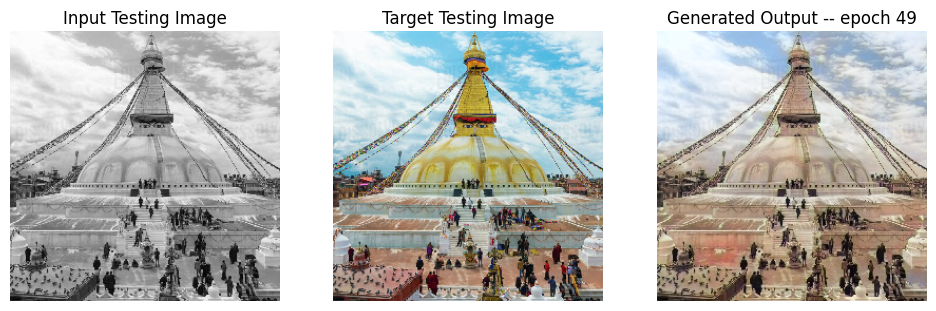

SSIM Score: 0.9132981300354004
PSNR Score: 22.01862907409668
Epoch 49
Training Details
Generator-- total_loss:6.59883 gan_loss:0.00000 l1_loss:0.03690 perceptual_loss:0.00709 Discriminator-- total_loss:36.23199 real_loss:36.23197 generated_loss:0.00002 --- SSIM 0.91783 PSNR 24.88241 LPIPS 0.00000
Time taken for epoch 50 is 575.4721982479095 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.97081 gan_loss:0.00000 l1_loss:0.03902  perceptual_loss:0.00745 Discriminator-- total_loss:32.29037 real_loss:32.29037 generated_loss:0.00001 --- SSIM 0.94819 PSNR 24.27350 LPIPS 0.00000
Time taken for epoch 50 is 622.8811945915222 sec
Number of iteration 70
Epoch 50
Training Details
Generator-- total_loss:6.58237 gan_loss:0.00000 l1_loss:0.03682 perceptual_loss:0.00706 Discriminator-- total_loss:36.22934 real_loss:36.22932 generated_loss:0.00002 --- SSIM 0.91905 PSNR 24.89592 LPIPS 0.00000
Time taken for epoch 51 is 576.1944117546082 sec
Number of iteration 525
Validation Detai

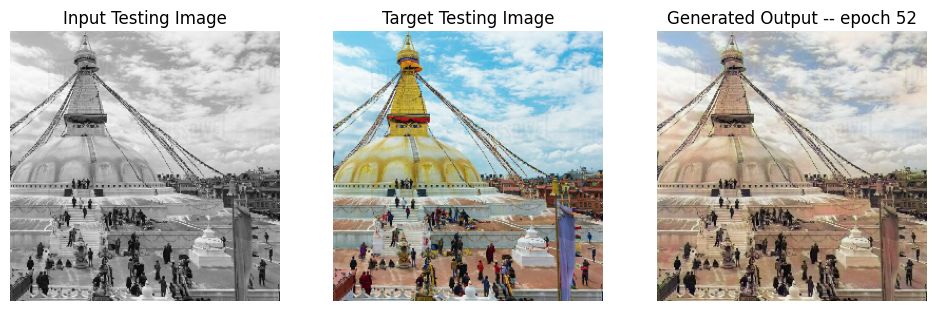

SSIM Score: 0.8992577195167542
PSNR Score: 20.927398681640625
Epoch 52
Training Details
Generator-- total_loss:6.54719 gan_loss:0.00000 l1_loss:0.03663 perceptual_loss:0.00701 Discriminator-- total_loss:36.53195 real_loss:36.53191 generated_loss:0.00004 --- SSIM 0.91907 PSNR 24.94573 LPIPS 0.00000
Time taken for epoch 53 is 577.8581581115723 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.61439 gan_loss:0.00000 l1_loss:0.03689  perceptual_loss:0.00721 Discriminator-- total_loss:30.31629 real_loss:30.31629 generated_loss:0.00000 --- SSIM 0.94845 PSNR 24.72421 LPIPS 0.00000
Time taken for epoch 53 is 624.7183706760406 sec
Number of iteration 70
Epoch 53
Training Details
Generator-- total_loss:6.55018 gan_loss:0.00000 l1_loss:0.03668 perceptual_loss:0.00698 Discriminator-- total_loss:36.32335 real_loss:36.32328 generated_loss:0.00007 --- SSIM 0.91814 PSNR 24.94136 LPIPS 0.00000
Time taken for epoch 54 is 576.328188419342 sec
Number of iteration 525
Validation Detai

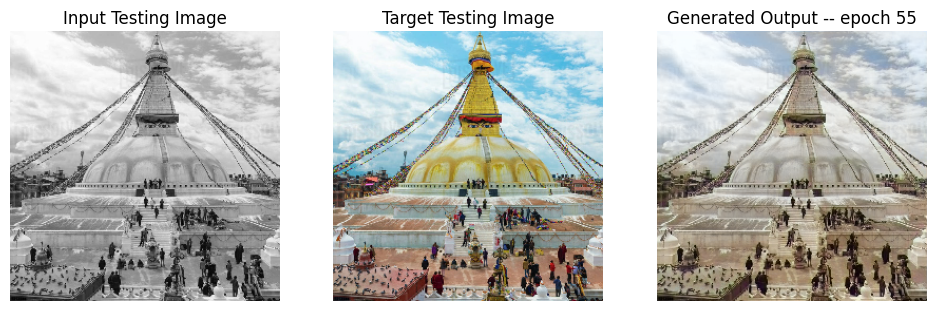

SSIM Score: 0.9157223701477051
PSNR Score: 21.947723388671875
Epoch 55
Training Details
Generator-- total_loss:6.48943 gan_loss:0.00000 l1_loss:0.03632 perceptual_loss:0.00694 Discriminator-- total_loss:36.26617 real_loss:36.26613 generated_loss:0.00004 --- SSIM 0.91881 PSNR 24.99271 LPIPS 0.00000
Time taken for epoch 56 is 573.9076805114746 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.77341 gan_loss:0.00000 l1_loss:0.03797  perceptual_loss:0.00719 Discriminator-- total_loss:33.64995 real_loss:33.64995 generated_loss:0.00000 --- SSIM 0.94887 PSNR 24.45353 LPIPS 0.00000
Time taken for epoch 56 is 620.6565673351288 sec
Number of iteration 70
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 56.
Epoch 56
Training Details
Generator-- total_loss:13.07292 gan_loss:6.63524 l1_loss:0.03600 perceptual_loss:0.00692 Discriminator-- total_loss:0.33554 real_loss:0.17817 generated_loss:0.15737 --- SSIM 0.91965 PSNR 25.06482 LPIPS 0.00000
Time taken for 

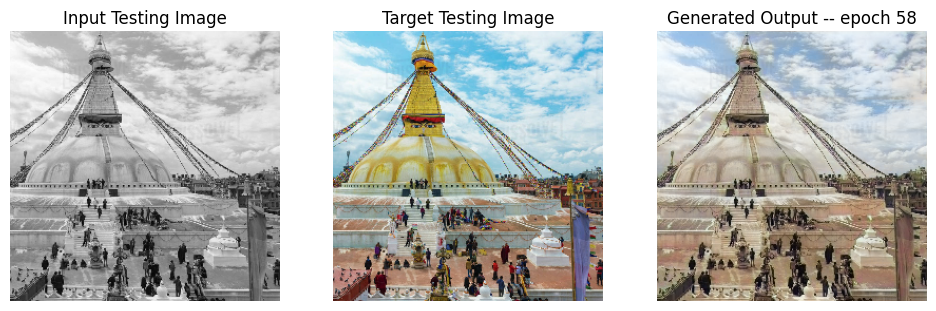

SSIM Score: 0.9069852828979492
PSNR Score: 22.19040298461914
Epoch 58
Training Details
Generator-- total_loss:16.80226 gan_loss:10.34161 l1_loss:0.03614 perceptual_loss:0.00693 Discriminator-- total_loss:0.00790 real_loss:0.00402 generated_loss:0.00388 --- SSIM 0.91997 PSNR 25.05359 LPIPS 0.00000
Time taken for epoch 59 is 435.8315465450287 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.52552 gan_loss:0.00264 l1_loss:0.03636  perceptual_loss:0.00712 Discriminator-- total_loss:7.75028 real_loss:7.74282 generated_loss:0.00746 --- SSIM 0.95003 PSNR 24.84488 LPIPS 0.00000
Time taken for epoch 59 is 482.57084250450134 sec
Number of iteration 70
Epoch 59
Training Details
Generator-- total_loss:17.68857 gan_loss:11.23796 l1_loss:0.03609 perceptual_loss:0.00691 Discriminator-- total_loss:0.00389 real_loss:0.00180 generated_loss:0.00209 --- SSIM 0.91963 PSNR 25.04984 LPIPS 0.00000
Time taken for epoch 60 is 434.45491790771484 sec
Number of iteration 525
Validation Detai

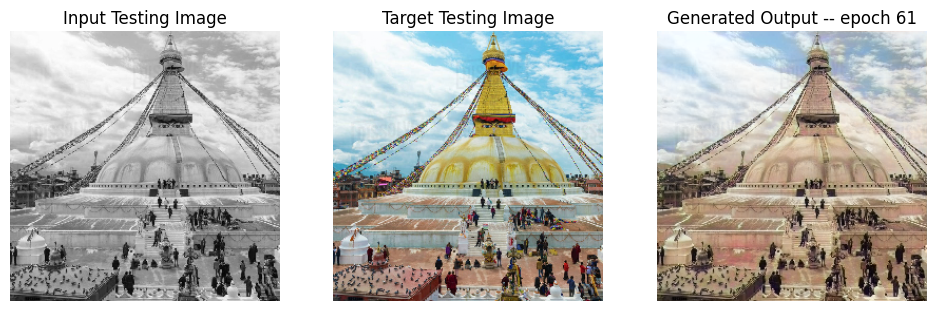

SSIM Score: 0.9139113426208496
PSNR Score: 21.638160705566406
Epoch 61
Training Details
Generator-- total_loss:6.43552 gan_loss:0.00503 l1_loss:0.03604 perceptual_loss:0.00683 Discriminator-- total_loss:12.35362 real_loss:12.35238 generated_loss:0.00124 --- SSIM 0.91922 PSNR 25.05593 LPIPS 0.00000
Time taken for epoch 62 is 577.3880491256714 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.70317 gan_loss:0.00013 l1_loss:0.03751  perceptual_loss:0.00717 Discriminator-- total_loss:12.32408 real_loss:12.32369 generated_loss:0.00038 --- SSIM 0.94911 PSNR 24.62973 LPIPS 0.00000
Time taken for epoch 62 is 623.7402594089508 sec
Number of iteration 70
Epoch 62
Training Details
Generator-- total_loss:6.42889 gan_loss:0.00653 l1_loss:0.03599 perceptual_loss:0.00682 Discriminator-- total_loss:12.34207 real_loss:12.34124 generated_loss:0.00083 --- SSIM 0.91904 PSNR 25.06378 LPIPS 0.00000
Time taken for epoch 63 is 576.0314071178436 sec
Number of iteration 525
Validation Deta

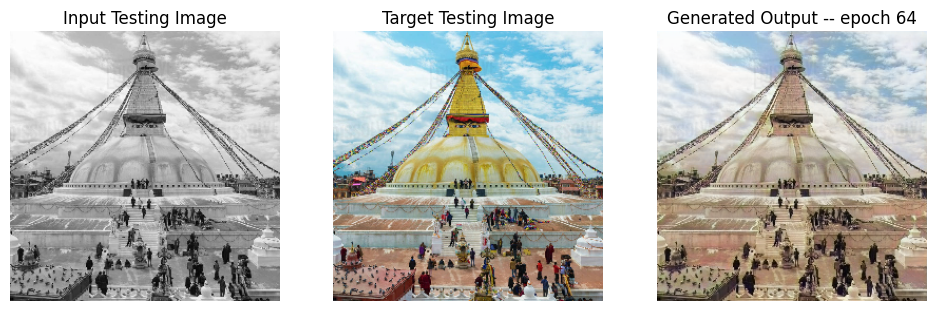

SSIM Score: 0.9156480431556702
PSNR Score: 22.20186996459961
Epoch 64
Training Details
Generator-- total_loss:6.40976 gan_loss:0.00508 l1_loss:0.03588 perceptual_loss:0.00682 Discriminator-- total_loss:11.52701 real_loss:11.52602 generated_loss:0.00098 --- SSIM 0.92009 PSNR 25.09173 LPIPS 0.00000
Time taken for epoch 65 is 571.2687911987305 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.84336 gan_loss:0.00012 l1_loss:0.03852  perceptual_loss:0.00710 Discriminator-- total_loss:12.57872 real_loss:12.57841 generated_loss:0.00031 --- SSIM 0.95005 PSNR 24.44558 LPIPS 0.00000
Time taken for epoch 65 is 617.1466715335846 sec
Number of iteration 70
Epoch 65
Training Details
Generator-- total_loss:6.39863 gan_loss:0.00425 l1_loss:0.03584 perceptual_loss:0.00679 Discriminator-- total_loss:11.28565 real_loss:11.28457 generated_loss:0.00108 --- SSIM 0.91975 PSNR 25.10304 LPIPS 0.00000
Time taken for epoch 66 is 568.8828144073486 sec
Number of iteration 525
Validation Detai

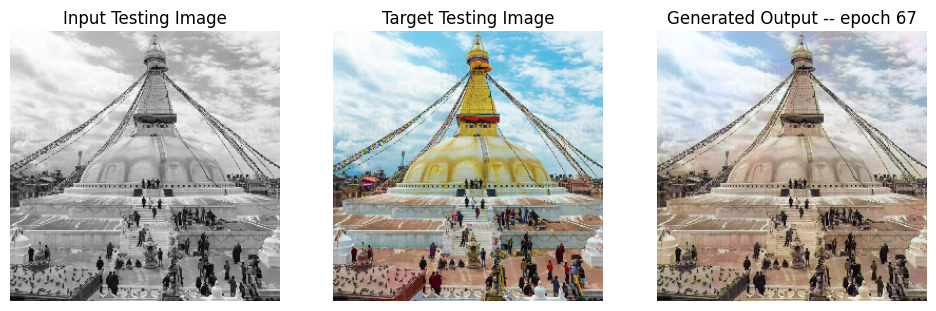

SSIM Score: 0.9150499701499939
PSNR Score: 22.094255447387695
Epoch 67
Training Details
Generator-- total_loss:6.38269 gan_loss:0.00463 l1_loss:0.03575 perceptual_loss:0.00677 Discriminator-- total_loss:11.36327 real_loss:11.36205 generated_loss:0.00123 --- SSIM 0.92011 PSNR 25.12620 LPIPS 0.00000
Time taken for epoch 68 is 571.110109090805 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.58585 gan_loss:0.00013 l1_loss:0.03688  perceptual_loss:0.00702 Discriminator-- total_loss:13.03142 real_loss:13.03097 generated_loss:0.00045 --- SSIM 0.95066 PSNR 24.76841 LPIPS 0.00000
Time taken for epoch 68 is 617.8580896854401 sec
Number of iteration 70
Reduced discriminator learning rate to 9.000000427477062e-05 at epoch 68.
Epoch 68
Training Details
Generator-- total_loss:12.31427 gan_loss:5.95239 l1_loss:0.03559 perceptual_loss:0.00682 Discriminator-- total_loss:0.25860 real_loss:0.13231 generated_loss:0.12630 --- SSIM 0.91926 PSNR 25.15818 LPIPS 0.00000
Time taken for e

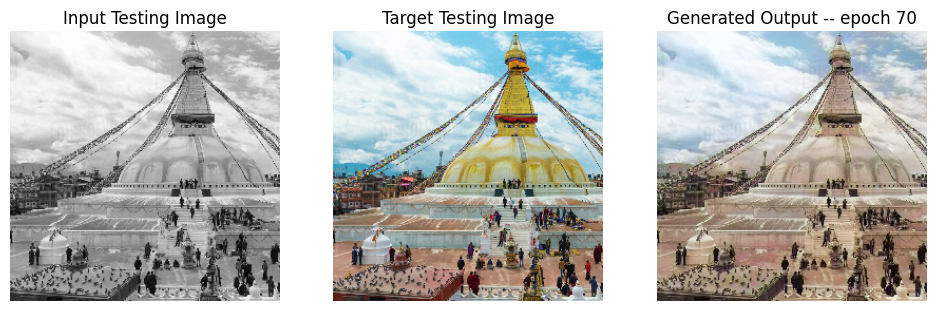

SSIM Score: 0.918940544128418
PSNR Score: 22.363893508911133
Epoch 70
Training Details
Generator-- total_loss:14.37261 gan_loss:8.03470 l1_loss:0.03547 perceptual_loss:0.00678 Discriminator-- total_loss:0.04286 real_loss:0.01862 generated_loss:0.02424 --- SSIM 0.91975 PSNR 25.17741 LPIPS 0.00000
Time taken for epoch 71 is 431.7964680194855 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.51869 gan_loss:0.09185 l1_loss:0.03585  perceptual_loss:0.00700 Discriminator-- total_loss:3.46395 real_loss:3.38854 generated_loss:0.07541 --- SSIM 0.95014 PSNR 24.93191 LPIPS 0.00000
Time taken for epoch 71 is 478.63912987709045 sec
Number of iteration 70
Epoch 71
Training Details
Generator-- total_loss:14.79082 gan_loss:8.45480 l1_loss:0.03547 perceptual_loss:0.00677 Discriminator-- total_loss:0.04408 real_loss:0.02050 generated_loss:0.02359 --- SSIM 0.91911 PSNR 25.18394 LPIPS 0.00000
Time taken for epoch 72 is 430.81694293022156 sec
Number of iteration 525
Validation Details

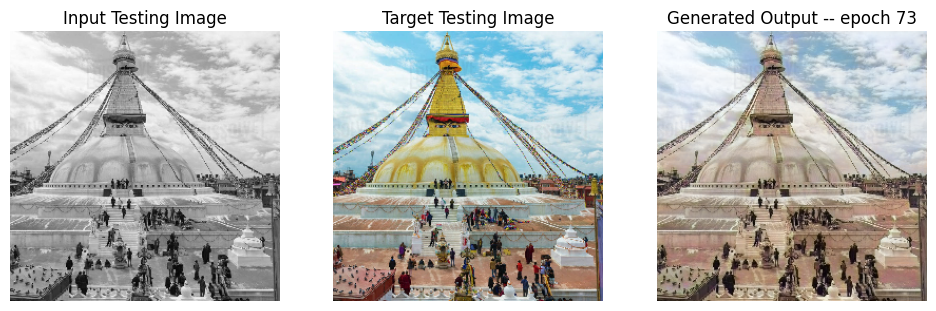

SSIM Score: 0.9146370887756348
PSNR Score: 22.386306762695312
Epoch 73
Training Details
Generator-- total_loss:16.32309 gan_loss:9.98214 l1_loss:0.03549 perceptual_loss:0.00678 Discriminator-- total_loss:0.01988 real_loss:0.00960 generated_loss:0.01028 --- SSIM 0.92058 PSNR 25.16251 LPIPS 0.00000
Time taken for epoch 74 is 430.59250950813293 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.58146 gan_loss:0.15022 l1_loss:0.03591  perceptual_loss:0.00697 Discriminator-- total_loss:3.14692 real_loss:3.00540 generated_loss:0.14153 --- SSIM 0.95043 PSNR 24.93212 LPIPS 0.00000
Time taken for epoch 74 is 476.68327379226685 sec
Number of iteration 70
Epoch 74
Training Details
Generator-- total_loss:16.38673 gan_loss:10.03510 l1_loss:0.03555 perceptual_loss:0.00680 Discriminator-- total_loss:0.01670 real_loss:0.00779 generated_loss:0.00891 --- SSIM 0.91945 PSNR 25.16204 LPIPS 0.00000
Time taken for epoch 75 is 429.4224097728729 sec
Number of iteration 525
Validation Detai

In [53]:
fit(train_dataset, epochs, val, gen)

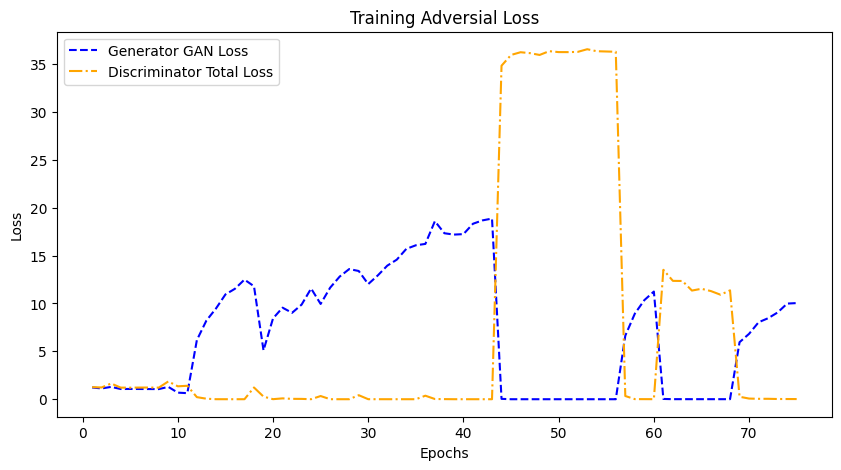

In [54]:
epochs = range(1, len(train_generator_losses) + 1)
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Training Adversial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

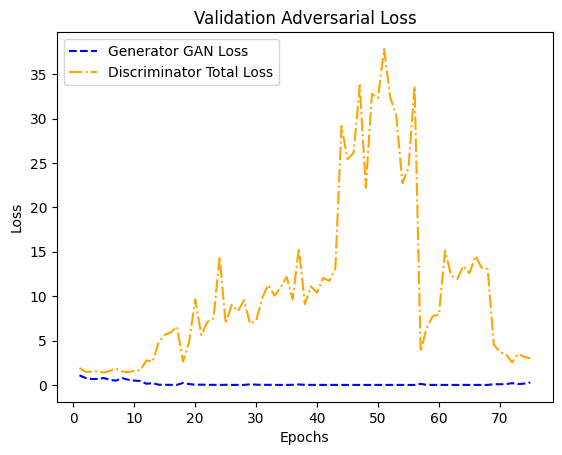

In [55]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Validation Adversarial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

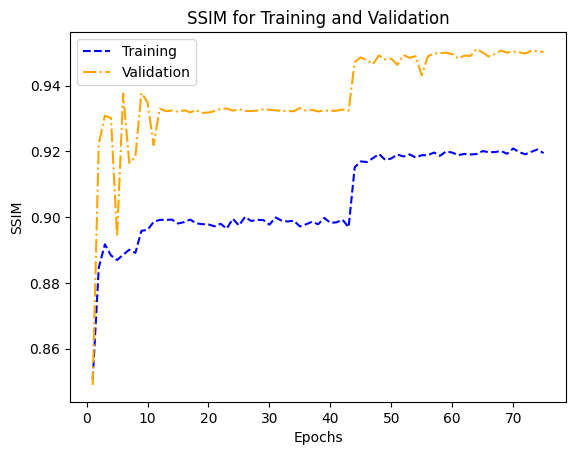

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

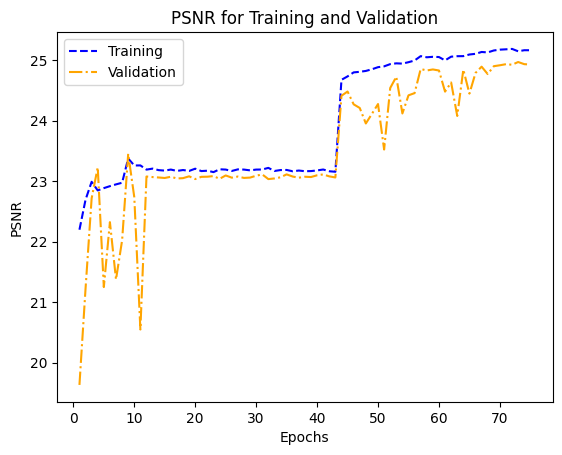

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

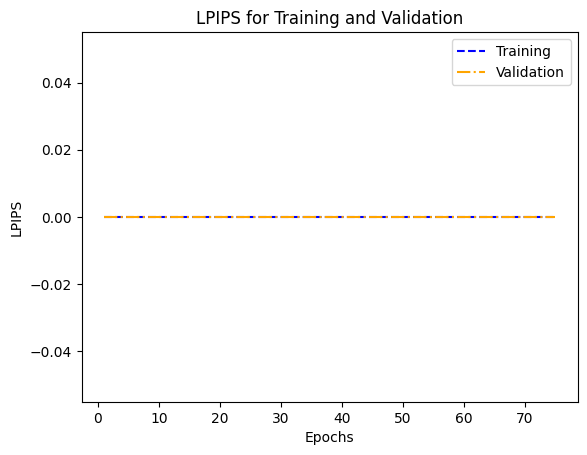

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

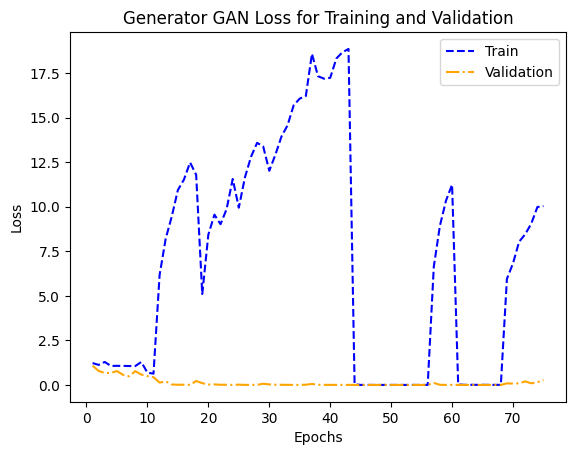

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

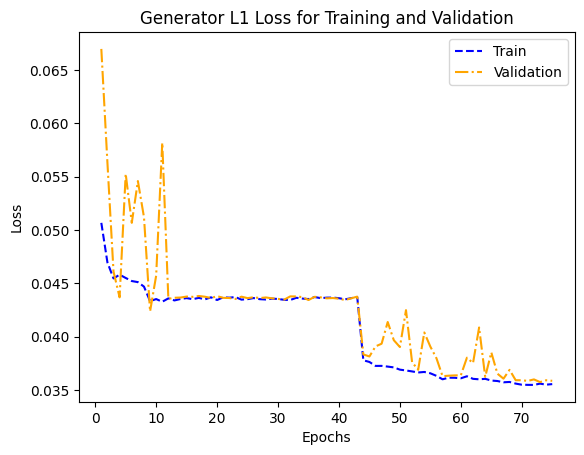

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

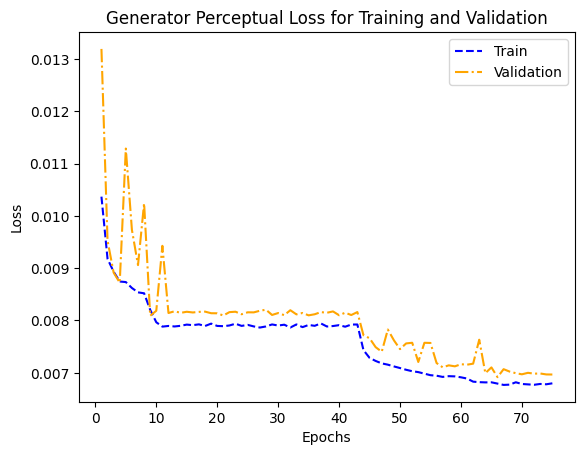

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

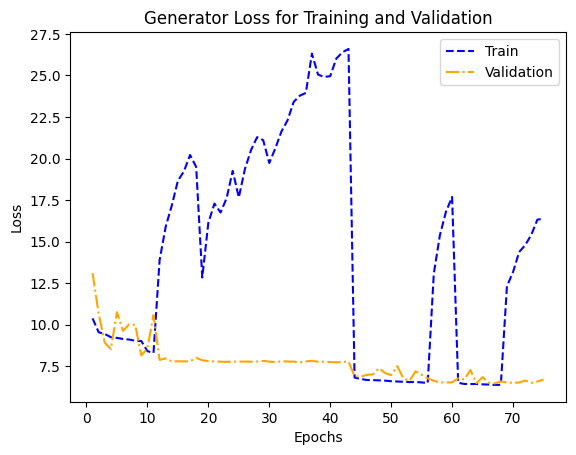

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

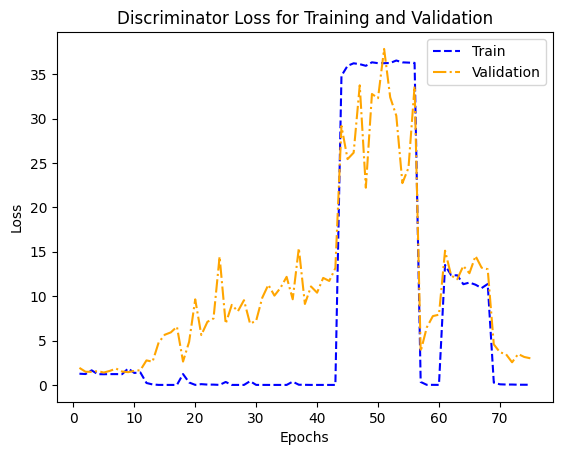

In [63]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

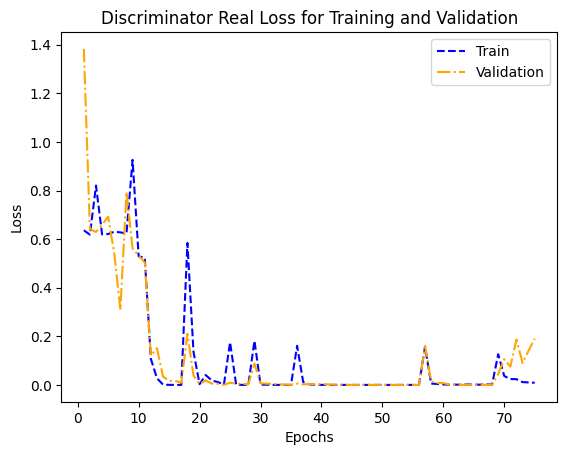

In [64]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

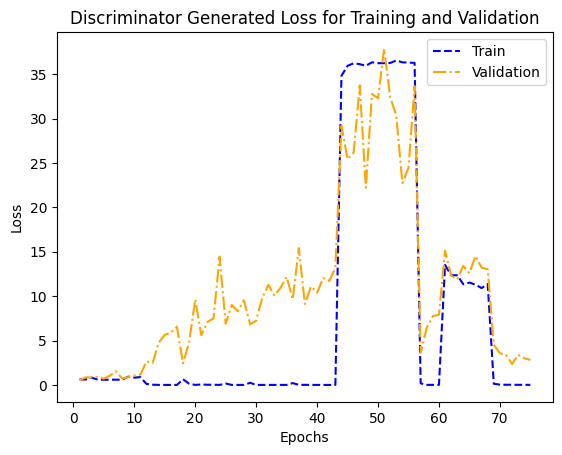

In [65]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [66]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [67]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [68]:
os.mkdir('/kaggle/working/modelsFeb7')

In [69]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [70]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [71]:
import subprocess
from IPython.display import FileLink, display

In [72]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip